# Fix a few large outliers on FAR / DUA in the zoning lookups

In [1]:
import pandas as pd
import pathlib
from pathlib import Path
import geopandas as gpd
import numpy as np
import os

/Users/aolsen/opt/anaconda3/envs/geo_env_2/lib/python3.10/site-packages/geopandas/_compat.py:123: UserWarning: The Shapely GEOS version (3.11.1-CAPI-1.17.1) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(
/var/folders/x8/3_n775lx7zq1nv3mddc7vmlh0000gp/T/ipykernel_14448/2270329256.py:4: UserWarning: Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas will still use PyGEOS by default for now. To force to use and test Shapely 2.0, you have to set the environment variable USE_PYGEOS=0. You can do this before starting the Python process, or in your code before importing geopandas:

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

In a future release, GeoPandas will switch to using Shapely by default. If you are using PyGEOS directly (calling PyGEOS functions on geometries from GeoPandas), this will then stop working and you are encouraged to migrate from PyGEOS to Sha

In [20]:
home_dir = Path.home()
box_dir = Path(home_dir,'Box')

In [21]:
m_drive = pathlib.Path("/Volumes/Data/Models") if os.name != "nt" else "M:/"
m_drive

PosixPath('/Volumes/Data/Models')

In [27]:
# set paths

zoning_lookup_path = m_drive / "urban_modeling" / "baus" / "BAUS Inputs" / \
    "basis_inputs" / "zoning" / "2024_04_09_zoning_lookup_hybrid_he_MS_pba50plus.csv"

zoning_parcels_path = m_drive / "urban_modeling" / "baus" / "BAUS Inputs" / \
    "basis_inputs" / "zoning" / "2024_04_09_zoning_parcels_hybrid_he_MS_pba50plus.csv"
zoning_parcels_path

PosixPath('/Volumes/Data/Models/urban_modeling/baus/BAUS Inputs/basis_inputs/zoning/2024_04_09_zoning_parcels_hybrid_he_MS_pba50plus.csv')

## Get geodata

In [25]:
# load a feather version of p10 parcels after the topology fixes
# https://app.asana.com/0/1202179257399094/1205973096797373/f

parcel_topo_file = box_dir / 'Modeling and Surveys' / 'Urban Modeling' / \
    'Bay Area UrbanSim' / 'PBA50' / 'Policies' / \
    'Base zoning' / 'inputs' / 'p10_geo.feather'

p10_topofix = gpd.read_feather(parcel_topo_file)
p10_topofix['geom_pt'] = p10_topofix.representative_point()
p10_topofix_pt = p10_topofix.set_geometry('geom_pt')[['PARCEL_ID', 'geom_pt']]

In [10]:
# load parcels
zoning_parcels = pd.read_csv(zoning_parcels_path)

## Get zoning data

In [56]:
# load lookups
zoning_lookup = pd.read_csv(zoning_lookup_path)

# add a tracker field

zoning_lookup['adjusted'] = None

In [59]:
zoning_lookup.max_far.sort_values().dropna()

8369        0.000000
6025        0.000000
8435        0.000000
8430        0.000000
17889       0.000000
            ...     
4650       33.333333
6909     4400.000000
6922     4400.000000
6920     4400.000000
6890     5220.000000
Name: max_far, Length: 6016, dtype: float64

## Check outliers

<AxesSubplot: >

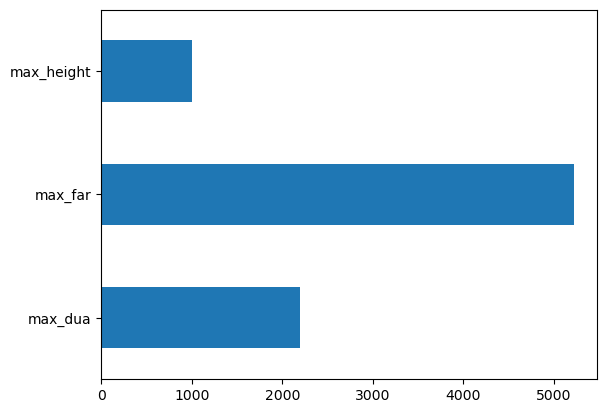

In [66]:
# where are we? large, if uncommon FAR values

zoning_lookup[['max_dua', 'max_far', 'max_height']].max().plot(kind='barh')

In [67]:
# Check for the largest outliers wrt FAR
large_far_mask_35 = zoning_lookup.eval('max_far>35')
print(large_far_mask_35.value_counts())

False    17913
True         4
Name: count, dtype: int64


In [68]:
# these are clearly an error - oddly they have the same name - the DUAs are really small, so FAR should 
# probably be around 1, tops. Or just set to missing and let BAUS work with the DUA
zoning_lookup[large_far_mask_35]

,id,juris,name,max_dua,max_far,max_height,HS,HT,HM,OF,...,SC,IL,IW,IH,RS,RB,MR,MT,ME,adjusted
6890,6891,san_jose,714 - Medium Density Residential_pba40,2.90,5220.0,26.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,None
6909,6910,san_jose,714 - Medium Density Residential_pba40,4.35,4400.0,26.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,None
6920,6921,san_jose,714 - Medium Density Residential_pba40,4.35,4400.0,26.0,1.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,None
6922,6923,san_jose,Neighborhood/Community Commercial_pba40,4.35,4400.0,26.0,1.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,None


In [69]:
# there is nothing magic about these thresholds - but SF's C3 financial district has a base FAR of 9, and FAR 18 with a
# conditional use like process so probably a reasonable upper level for most of the region

large_far_mask_18 = zoning_lookup.eval('18 < max_far <= 35')
print(large_far_mask_18.value_counts())

False    17896
True        21
Name: count, dtype: int64


In [70]:
zoning_lookup[large_far_mask_18].shape

(21, 21)

In [71]:
# overwrite to missing - these are bunkers, though we could also set to 1 without much harm


# zoning_lookup.loc[large_far_mask_35, ['max_far', 'adjusted']
#                   ] = zoning_lookup.loc[large_far_mask_35, 'max_far'].clip(0, 18), 'Set to None'

zoning_lookup.loc[large_far_mask_35, ['max_far', 'adjusted']] = None, 'Clip >35'


In [72]:
# these we can just clip to 18
zoning_lookup.loc[large_far_mask_18, ['max_far', 'adjusted']] = zoning_lookup.loc[large_far_mask_18,'max_far'].clip(0,18), 'Clipped to 18'

/Users/aolsen/opt/anaconda3/envs/geo_env_2/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3199: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return asarray(a).ndim


In [73]:
large_dua_mask = zoning_lookup.eval('max_dua>500')
print(large_dua_mask.value_counts())

# overwrite to missing
zoning_lookup.loc[large_dua_mask, ['max_dua', 'adjusted']] = None, 'Clip >500'

False    17863
True        54
Name: count, dtype: int64


## Specific categories or sites adjustments 

In [76]:
# large dev in pleasanton is for specific zone id 10199
large_dev_mask = zoning_lookup.eval('id==10199')

print(large_dev_mask.value_counts())

zoning_lookup.loc[large_dev_mask, ['max_dua',
                                   'adjusted']] = 10, 'Set to 10 from 154'

False    17916
True         1
Name: count, dtype: int64


Parcel identified by Mark 
Context: this is the Alameda County Fairgrounds which, although perhaps not the worst place for a megaproject, is outside of a GG and under local zoning not permitted for housing. So for plan consistency purposes, it shouldn't really have any development

378337

In [77]:
ala_fairgrounds_parcel_id = [378337, 378336]
other_large = [358920]

zoning_parcels[zoning_parcels.PARCEL_ID.isin(
    [ala_fairgrounds_parcel_id+other_large])]

,PARCEL_ID,geom_id,juris_id,juris,zoning_id,nodev,prop,zoning


In [133]:
zoning_parcels[zoning_parcels.PARCEL_ID.isin(other_large)]

,PARCEL_ID,geom_id,juris_id,juris,zoning_id,nodev,prop,zoning
358074,358920,14880815967518,unincorporated_alameda,1,900,0,99.0,NODEV_pba40


In [83]:
# those parcel ids are not present in the zoning parcels file - check for others with the same fate

orphaned_parcel_ids = pd.Series(list(set(p10_topofix.PARCEL_ID) -
          set(zoning_parcels.PARCEL_ID))).clip(1)

orphaned_parcel_ids.shape
# (5476,) parcel ids not found in the parcel zoning file - could be (mostly) water parcels

(5476,)

In [130]:
# compare shapes of the two parcel files
print(zoning_parcels.shape)

print(p10_topofix.shape)

(1950732, 8)
(1956208, 15)


Investigate a bit if there is a pattern to parcel ids not found in the zoning file. There is a Loyola problem.
Though apparently not a lot of undeveloped capacity there.

In [136]:
parcel_id_for_map_center = 1454608
gpmap = p10_topofix.query('PARCEL_ID==@parcel_id_for_map_center').buffer(1000).explore(color='none')

p10_topfix.loc[(p10_topfix.PARCEL_ID.isin(orphaned_parcel_ids)) &(p10_topfix.is_valid)].explore(m=gpmap)

Static version

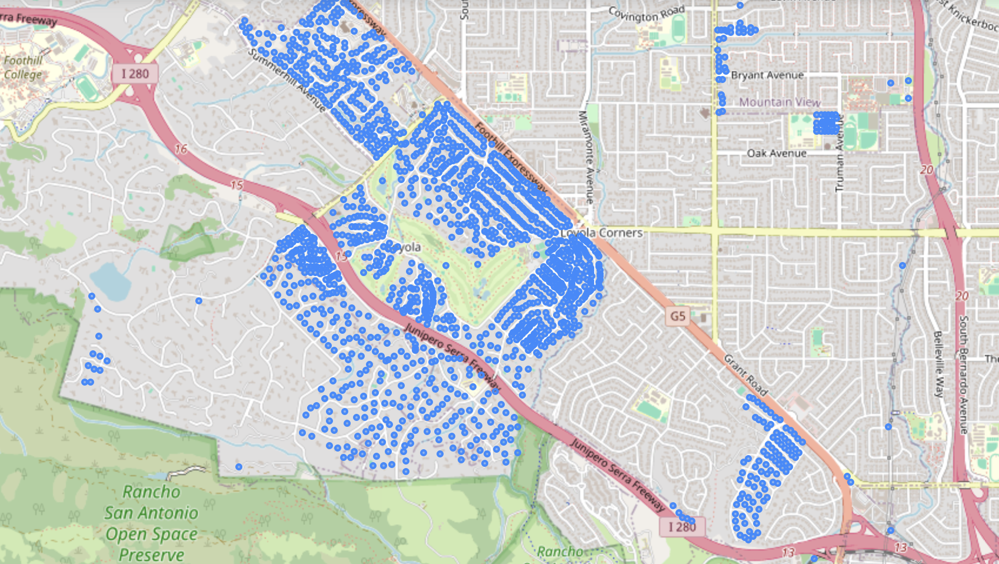

# Write output

In [71]:
# set path for new zoning lookup table
zoning_lookup_path_new = m_drive / "urban_modeling" / "baus" / "BAUS Inputs" / \
    "basis_inputs" / "zoning" / \
    "2024_04_09_zoning_lookup_hybrid_he_MSClip_2tier_pba50plus.csv"

In [72]:
zoning_lookup.to_csv(zoning_lookup_path_new)

In [13]:
zoning_lookup_new = pd.read_csv(m_drive / "urban_modeling" / "baus" / "BAUS Inputs" / \
    "basis_inputs" / "zoning" / \
    "2024_04_09_zoning_lookup_hybrid_he_MSClip_pba50plus.csv")